אלי ממי

תז 931203129

אלעד דוד

תז 315088724

### Question 2 : **GAN** model

---



In [28]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [4]:
import os
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.datasets as dsets
import torchvision.transforms as transforms
from torch import optim
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import matplotlib
from torchvision.utils import save_image
import matplotlib.pyplot as plt
import numpy as np
from tqdm import tqdm
import pickle

In [7]:
def to_cuda(x):
    if torch.cuda.is_available():
        x = x.cuda()
    return x

def denorm(x):
    out = (x + 1) / 2
    return out.clamp(0, 1)

def save_to_pkl(D, G, name):
    models = {'D': D.state_dict(), 'G': G.state_dict()}
    with open(name, 'wb') as f:
        pickle.dump(models, f)

In [31]:
def training_GAN_model(num_epoch, Discriminator, Generator, d_optimizer, g_optimizer, criterion , train_loader ):

  generated_images =[]
  d_loss_by_epochs = []
  g_loss_by_epochs = []
  for epoch in range(num_epoch):
    total_loss_discriminator = 0
    total_loss_generator = 0
    for i, (images, _) in enumerate(train_loader):
      batch_size = images.size(0)
      images = to_cuda(images.view(batch_size, -1))
      # Create the labels which are later used as input for the BCE loss
      real_labels = to_cuda(torch.ones(batch_size))
      fake_labels = to_cuda(torch.zeros(batch_size))

      #============= Train the discriminator =============#
      # Compute BCE_Loss using real images where BCE_Loss(x, y):
      #         - y * log(D(x)) - (1-y) * log(1 - D(x))
      # Second term of the loss is always zero since real_labels == 1
      Discriminator.train()
      Generator.train(False) # <-> G.eval()

      outputs = Discriminator(images) # Real images
      d_loss_real = criterion(outputs.squeeze(1), real_labels)

      real_score = outputs

      # Compute BCELoss using fake images
      # First term of the loss is always zero since fake_labels == 0
      z = to_cuda(torch.randn(batch_size, 64))
      fake_images = Generator(z) # Generate fake images
      outputs = Discriminator(fake_images)
      d_loss_fake = criterion(outputs.squeeze(1), fake_labels)
      fake_score = outputs

      # Backprop + Optimize
      d_loss = d_loss_real + d_loss_fake
      total_loss_discriminator += d_loss
      Discriminator.zero_grad()
      d_loss.backward()
      d_optimizer.step()

      #=============== Train the generator ===============#
      # Compute loss with fake images
      Discriminator.train(False)
      Generator.train()
      z = to_cuda(torch.randn(batch_size, 64))
      fake_images = Generator(z)
      outputs = Discriminator(fake_images)

      # We train G to maximize log(D(G(z)) instead of minimizing log(1-D(G(z)))
      g_loss = criterion(outputs.squeeze(1), real_labels)
      total_loss_generator += g_loss

      # Backprop + Optimize
      Discriminator.zero_grad()
      Generator.zero_grad()
      g_loss.backward()
      g_optimizer.step()


    d_loss_by_epochs.append((total_loss_discriminator / len(train_loader)).item())

    g_loss_by_epochs.append((total_loss_generator / len(train_loader)).item())


    if epoch in [1,30,60,90,120,150,180,210,240]:

      fake_image = fake_images.data[0].view(3, 64, 64)
      generated_images.append(denorm(fake_image).permute(1, 2, 0).cpu().numpy())


  for image, epoch in zip(generated_images, [1,30,60,90,120,150,180,210,240]):
    print()
    print(f"Image of epoch {epoch}:")
    plt.imshow(image)
    plt.show()


  return d_loss_by_epochs, g_loss_by_epochs



In [32]:
def latent_space_visualization(generateur, dimension_latente, n=15):
    generateur.eval()
    device = next(generateur.parameters()).device
    # Generate two random points
    point_start = torch.randn(1, dimension_latente).to(device)
    point_end = torch.randn(1, dimension_latente).to(device)
    # switching between the 2 points
    latent_vectors = [point_start * (1 - i) + point_end * i for i in np.linspace(0, 1, n)]
    latent_vectors = torch.cat(latent_vectors, dim=0).to(device)
    with torch.no_grad():
        images_generees = generateur(latent_vectors)

    # Plotting
    fig, axes = plt.subplots(1, n, figsize=(20, 8))
    for i, img in enumerate(images_generees):
        img = img.view(3, 64, 64).permute(1, 2, 0).cpu().numpy()
        # Utilisez votre fonction de dénormalisation ici si nécessaire
        axes[i].imshow((img * 255).astype(np.uint8))
        axes[i].axis('off')
    plt.show()



In [33]:
def run_model():
  batch_size = 50
  path_to_data_root = "/content/drive/My Drive/celeba"
  transform = transforms.Compose([
                transforms.Resize(64),
                transforms.CenterCrop(64),
                transforms.ToTensor(),
                transforms.Normalize(mean=[0.5, 0.5, 0.5],
                                     std=[0.5, 0.5, 0.5])])
  train_dataset = ImageFolder(root=path_to_data_root, transform = transform)
  train_loader = DataLoader(dataset=train_dataset,batch_size=batch_size,shuffle=True)
  # Discriminator
  D = nn.Sequential(
    nn.Linear(3 * 64 * 64, 256), 
    nn.LeakyReLU(0.2),
    nn.Linear(256, 256),
    nn.LeakyReLU(0.2),
    nn.Linear(256, 1),
    nn.Sigmoid())

  # Generator
  G = nn.Sequential(
      nn.Linear(64, 256),
      nn.LeakyReLU(0.2),
      nn.Linear(256, 256),
      nn.LeakyReLU(0.2),
      nn.Linear(256, 64*64*3),
      nn.Tanh())
  if torch.cuda.is_available():
    D.cuda()
    G.cuda()

  criterion = nn.BCELoss()

  d_optimizer = torch.optim.Adam(D.parameters(), lr=0.0003)
  g_optimizer = torch.optim.Adam(G.parameters(), lr=0.0003)
  d_loss_by_epochs, g_loss_by_epochs=training_GAN_model(250, D, G, d_optimizer, g_optimizer, criterion, train_loader)
  save_to_pkl(D, G, "/content/drive/My Drive/HW3_931203129_315088724.pkl")
  epochs = [i for i in range(250)]
  plt.plot(epochs, d_loss_by_epochs, label='discriminator', color='red')
  plt.plot(epochs, g_loss_by_epochs, label='generator', color='blue')
  plt.title('Value of losses of the discriminator and the generator by epochs')
  plt.xlabel('epochs')
  plt.ylabel('value of loss')
  plt.legend()
  plt.tight_layout()
  plt.show()
  latent_space_visualization(G, 64)
  return d_loss_by_epochs, g_loss_by_epochs


Image of epoch 1:


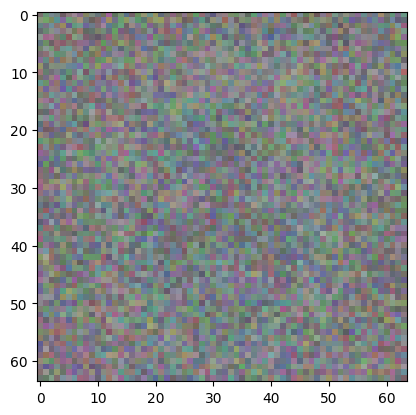


Image of epoch 30:


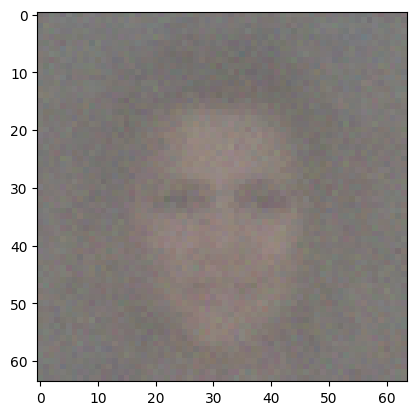


Image of epoch 60:


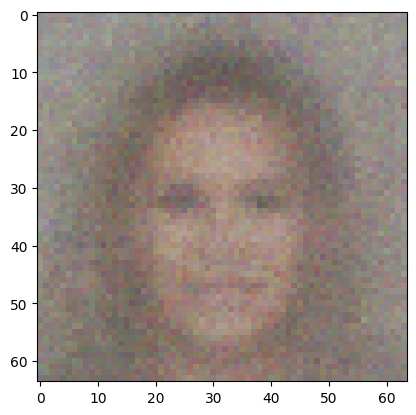


Image of epoch 90:


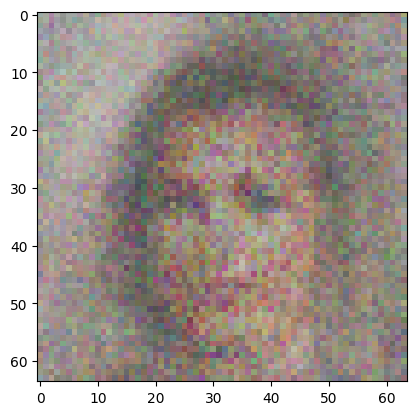


Image of epoch 120:


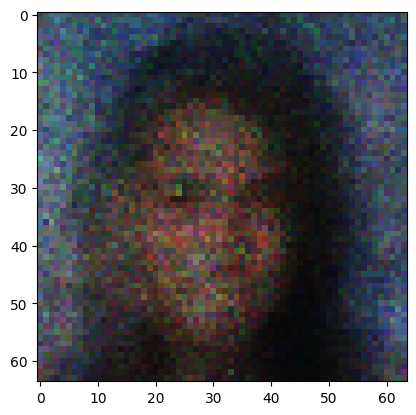


Image of epoch 150:


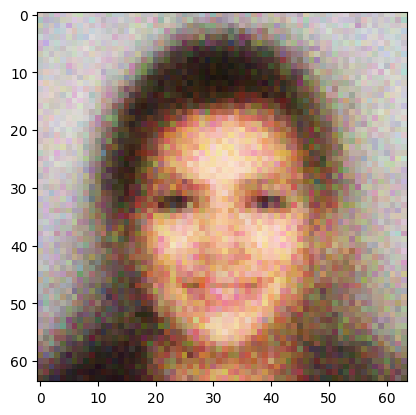


Image of epoch 180:


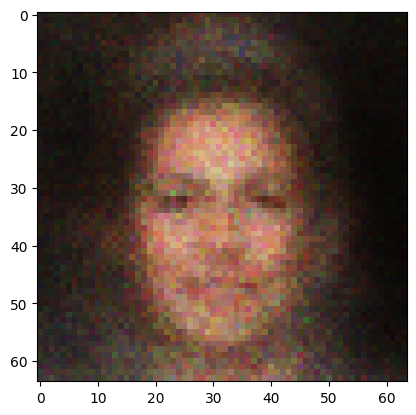


Image of epoch 210:


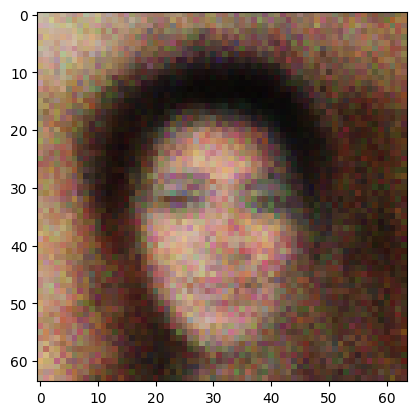


Image of epoch 240:


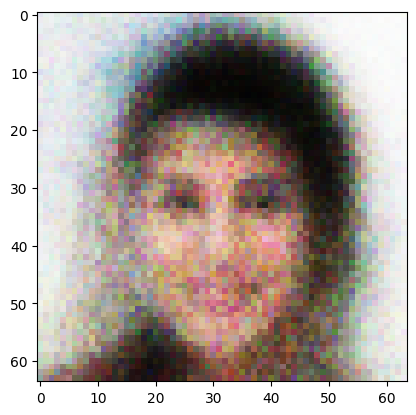

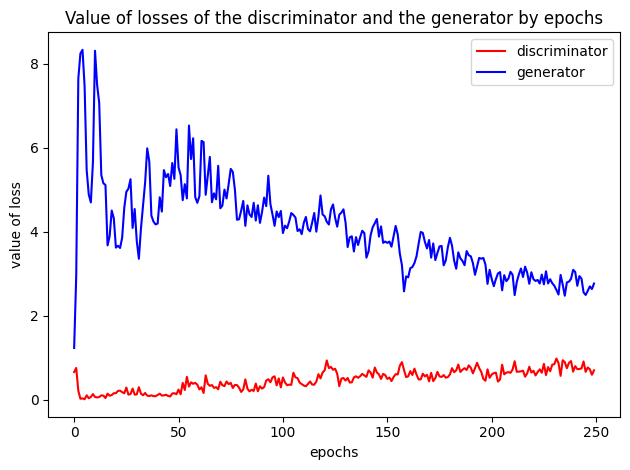

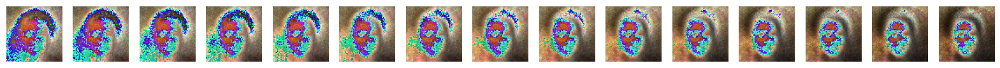

In [35]:
running = run_model()

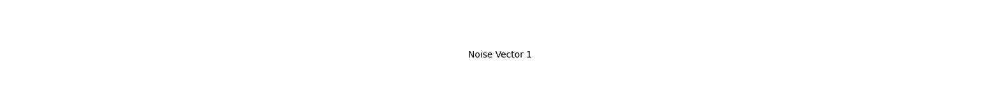

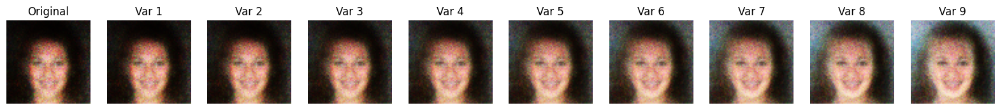

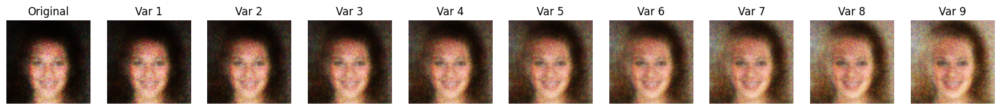

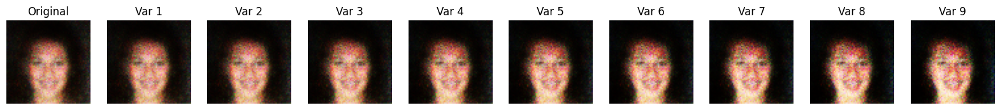

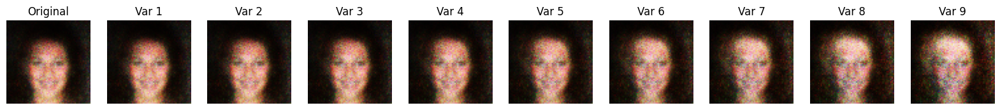

...

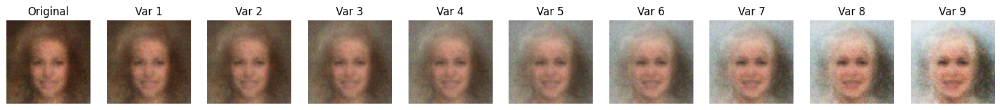

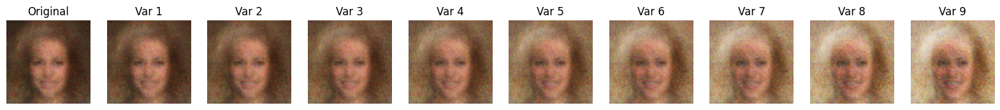

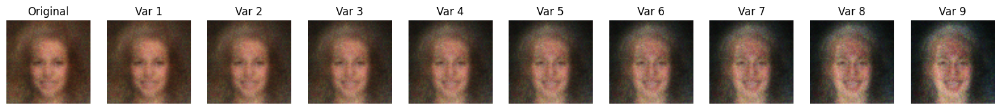

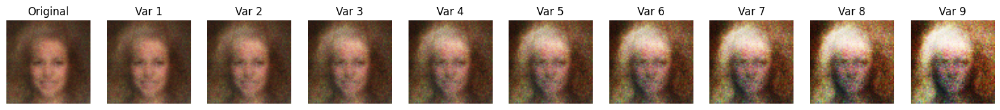

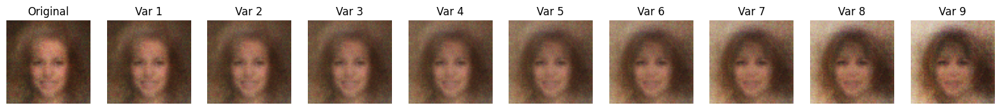

In [1]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from torch import nn
import pickle

def to_cuda(x):
    if torch.cuda.is_available():
        x = x.cuda()
    return x

def denorm(x):
    out = (x + 1) / 2
    return out.clamp(0, 1)

def load_pkl_model(D, G, path):
  with open(path, 'rb') as f:
      models = pickle.load(f)

  D.load_state_dict(models['D'])
  G.load_state_dict(models['G'])


def reproduce_hw3():
    pkl_file = "HW3_931203129_315088724.pkl"
    d = 64  # Dimension of the noise vector
    n_pictures = 10  # Number of pictures to generate per noise element
    n_noises = 5  # Number of different noise vectors

    # Define the Discriminator
    D = nn.Sequential(
        nn.Linear(3 * 64 * 64, 256),  # 3 for colors, 64x64 for the resize
        nn.LeakyReLU(0.2),
        nn.Linear(256, 256),
        nn.LeakyReLU(0.2),
        nn.Linear(256, 1),
        nn.Sigmoid())

    # Define the Generator
    G = nn.Sequential(
        nn.Linear(64, 256),
        nn.LeakyReLU(0.2),
        nn.Linear(256, 256),
        nn.LeakyReLU(0.2),
        nn.Linear(256, 64*64*3),
        nn.Tanh())
    
    # Load the models to the appropriate device
    D = to_cuda(D)
    G = to_cuda(G)

    # Load the pre-trained model
    load_pkl_model(D, G, pkl_file)

    G.eval()
    device = next(G.parameters()).device

    # Generate 8 base noise vectors
    base_noises = torch.randn(n_noises, d).to(device)

    for noise_index, base_noise in enumerate(base_noises):  # Iterate through each base noise vector
        plt.figure(figsize=(20, 2))
        plt.text(0.5, 0.5, f"Noise Vector {noise_index + 1}", horizontalalignment='center', verticalalignment='center')
        plt.axis('off')
        plt.show()

        for element_index in range(5):  # Iterate through the first five elements
            fig, axes = plt.subplots(1, n_pictures, figsize=(20, 4))  # One row per element
            
            # First, display the image generated from the original noise vector
            with torch.no_grad():
                original_image = G(base_noise.unsqueeze(0)).view(3, 64, 64)
                original_image = denorm(original_image).permute(1, 2, 0).cpu().detach().numpy()
                axes[0].imshow((original_image * 255).astype(np.uint8))
                axes[0].axis('off')
                axes[0].set_title(f"Original")

            adjustment = 0
            # Then, display the variations for the specific element
            for i in range(1, n_pictures):
                z = base_noise.clone().unsqueeze(0)  # Clone and unsqueeze to add batch dimension
                adjustment += 1  # Adjust this value as needed
                z[0, element_index] += adjustment

                with torch.no_grad():
                    picture_generated = G(z).view(3, 64, 64)
                    img = denorm(picture_generated).permute(1, 2, 0).cpu().detach().numpy()
                    axes[i].imshow((img * 255).astype(np.uint8))
                    axes[i].axis('off')
                    axes[i].set_title(f"Var {i}")

            plt.show()


reproduce_hw3()
